## Downloading necessary packages

In [ ]:
!pip install joblib
!pip install shap
!pip install lime
!pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 575.9/575.9 KB 33.3 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 19.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=69571b90a66c51f9796dfce78e226a8a47996335c43b25283be523a836aa1a77
  Stored in directory: /root/.cache/pip/wheels/e6/a6/20/cc1e293fcdb67ede666fed293cb895395e7ecceb4467779546
Successfully built lime
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 KB 16.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import numpy as np
import joblib
import pickle
import shap
import random
import matplotlib.pyplot as plt
import eli5
from sklearn.metrics import accuracy_score

In [ ]:
left_data=pd.read_csv("12.csv")
right_data=pd.read_csv("2.csv")
df = pd.concat([left_data, right_data], axis=0)
df = df.replace(',', '_', regex=True)
df

,P1,P2,P3,sample,distTh,angTh,coallition
0,5_7,7_12,13_2,11_15,7,1.57,nocoallition
1,1_8,6_3,4_14,3_6,7,1.57,{1_2}
2,14_2,12_12,9_3,11_8,7,1.57,{1_2_3}
3,3_4,14_2,4_1,9_5,7,1.57,{1_2_3}
4,14_3,2_5,7_2,7_1,7,1.57,{2_3}
...,...,...,...,...,...,...,...
9994,5_8,6_15,15_12,14_15,5,1.57,nocoallition
9995,12_12,6_6,7_9,6_6,5,1.57,{2_3}
9996,8_3,15_4,7_1,11_13,5,1.57,nocoallition
9997,12_3,5_5,2_15,3_2,5,1.57,nocoallition


In [ ]:
# # Load the data into a Pandas DataFrame
# df = pd.read_csv("12.csv")
# df = df.replace(',', '_', regex=True)
# #df.drop(df.loc[df['coallition']==0].index, inplace=True)



In [ ]:
counts = df['coallition'].value_counts()
counts

nocoallition    11826
{1_2}             887
{1_3}             867
{2_3}             844
{1_2_3}           574
Name: coallition, dtype: int64

In [ ]:

# user input for number of rows to delete
n = 10500
#n = 1500

# get the index of rows having value 2 in column 'A'
index_to_drop = df[df['coallition'] == 'nocoallition'].index[:n]

# drop the rows from the dataframe
df.drop(index_to_drop, inplace=True)

print(df)


         P1    P2     P3 sample  distTh  angTh    coallition
19    12_11   2_2    2_1    1_5       7   1.57         {2_3}
53      6_1   8_7  15_13   10_2       7   1.57         {1_2}
62     9_11  6_10   13_1   3_11       7   1.57         {1_2}
82      5_5   1_9    2_3    2_3       7   1.57       {1_2_3}
100     1_4   1_3    3_5    2_6       7   1.57       {1_2_3}
...     ...   ...    ...    ...     ...    ...           ...
9994    5_8  6_15  15_12  14_15       5   1.57  nocoallition
9995  12_12   6_6    7_9    6_6       5   1.57         {2_3}
9996    8_3  15_4    7_1  11_13       5   1.57  nocoallition
9997   12_3   5_5   2_15    3_2       5   1.57  nocoallition
9998   1_11   2_7   13_2    4_7       5   1.57  nocoallition

[2475 rows x 7 columns]


In [ ]:
df['coallition'].value_counts()

nocoallition    1326
{1_2}            357
{1_3}            330
{2_3}            314
{1_2_3}          148
Name: coallition, dtype: int64

In [ ]:
# Split the data into features (X) an1d target (y)
X = df.drop(columns=["coallition","distTh","angTh"], axis=1)
y = df["coallition"]
df

,P1,P2,P3,sample,distTh,angTh,coallition
19,12_11,2_2,2_1,1_5,7,1.57,{2_3}
53,6_1,8_7,15_13,10_2,7,1.57,{1_2}
62,9_11,6_10,13_1,3_11,7,1.57,{1_2}
82,5_5,1_9,2_3,2_3,7,1.57,{1_2_3}
100,1_4,1_3,3_5,2_6,7,1.57,{1_2_3}
...,...,...,...,...,...,...,...
9994,5_8,6_15,15_12,14_15,5,1.57,nocoallition
9995,12_12,6_6,7_9,6_6,5,1.57,{2_3}
9996,8_3,15_4,7_1,11_13,5,1.57,nocoallition
9997,12_3,5_5,2_15,3_2,5,1.57,nocoallition


In [ ]:
X


,P1,P2,P3,sample
19,12_11,2_2,2_1,1_5
53,6_1,8_7,15_13,10_2
62,9_11,6_10,13_1,3_11
82,5_5,1_9,2_3,2_3
100,1_4,1_3,3_5,2_6
...,...,...,...,...
9994,5_8,6_15,15_12,14_15
9995,12_12,6_6,7_9,6_6
9996,8_3,15_4,7_1,11_13
9997,12_3,5_5,2_15,3_2


In [ ]:
y.unique()

array(['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], dtype=object)

In [ ]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# Train a Random Forest classifier on the training data
clf = RandomForestClassifier(n_estimators=100, random_state=0,criterion="entropy",oob_score=bool)
clf.fit(X_train, y_train)

# Evaluate the model on the test data
accuracy = clf.score(X_test, y_test)
print(f"Test accuracy: {accuracy:.2f}")


Test accuracy: 0.71


In [ ]:
y_pred=clf.predict(X_test)

In [ ]:
y_pred

array(['{2_3}', 'nocoallition', 'nocoallition', 'nocoallition',
       'nocoallition', 'nocoallition', '{1_2}', '{1_2}', 'nocoallition',
       '{1_3}', '{1_3}', 'nocoallition', '{1_2}', 'nocoallition',
       'nocoallition', 'nocoallition', '{2_3}', '{2_3}', 'nocoallition',
       '{2_3}', '{1_2}', 'nocoallition', '{1_2}', '{1_3}', 'nocoallition',
       '{2_3}', 'nocoallition', 'nocoallition', 'nocoallition',
       'nocoallition', 'nocoallition', 'nocoallition', 'nocoallition',
       'nocoallition', '{1_3}', 'nocoallition', '{1_2}', '{2_3}', '{1_2}',
       'nocoallition', 'nocoallition', '{1_3}', 'nocoallition',
       'nocoallition', 'nocoallition', 'nocoallition', 'nocoallition',
       'nocoallition', '{1_2}', 'nocoallition', 'nocoallition',
       'nocoallition', 'nocoallition', 'nocoallition', 'nocoallition',
       'nocoallition', 'nocoallition', 'nocoallition', 'nocoallition',
       'nocoallition', 'nocoallition', '{1_3}', 'nocoallition',
       'nocoallition', 'nocoalliti

In [ ]:
y_pred=clf.predict(X_test)
np.unique(y_pred, return_counts=True)

(array(['nocoallition', '{1_2_3}', '{1_2}', '{1_3}', '{2_3}'], dtype=object),
 array([334,  16,  45,  55,  45]))

In [ ]:
filename = "gamemodelthreeplayers.joblib"
joblib.dump(clf, filename)

['gamemodelthreeplayers.joblib']

SHAP

In [ ]:
model = joblib.load(filename)
result = model.score(X_test, y_test)
print(result)

0.7111111111111111


###SHAP

In [ ]:
# create a SHAP explainer object
explainer = shap.TreeExplainer(clf)


In [ ]:
# compute SHAP values
shap_values = explainer.shap_values(X_test)


# Dissecting the SHAP value

In [ ]:
shap_values

[array([[ 0.0333402 , -0.01441289, -0.13799354, -0.05103478],
        [ 0.05477468,  0.04315829,  0.08708993,  0.09487609],
        [-0.01604924,  0.15871422,  0.00123141, -0.05399739],
        ...,
        [ 0.06496524,  0.07531062,  0.04461804,  0.02500509],
        [ 0.22259485, -0.02786619, -0.05442938, -0.11206696],
        [ 0.11612759,  0.05098   ,  0.01048951,  0.1223019 ]]),
 array([[-0.03183198, -0.00336463,  0.01689573, -0.00259811],
        [-0.01964716,  0.00029392, -0.00884937, -0.01269638],
        [ 0.00220907, -0.03713547, -0.00689009,  0.0009175 ],
        ...,
        [ 0.01448049, -0.00915523, -0.01272072, -0.02350353],
        [-0.00050815,  0.04026358,  0.03094535,  0.03006689],
        [-0.00157365,  0.00074852, -0.03910439, -0.00096947]]),
 array([[-0.01346451, -0.01937341, -0.03710789, -0.03476631],
        [-0.04308813, -0.02170828, -0.01695909, -0.04295663],
        [ 0.01107359, -0.12800732,  0.02839114,  0.01383046],
        ...,
        [-0.03487129, -0.00

In [ ]:
l_0=shap_values[0]
l_1=shap_values[1]
l_2=shap_values[2]
l_3=shap_values[3]
l_4=shap_values[4]

In [ ]:
dfl_0 = pd.DataFrame(data=l_0, columns=['P1','P2','P3','Sample'])

In [ ]:
dfl_0

,P1,P2,P3,Sample
0,0.033340,-0.014413,-0.137994,-0.051035
1,0.054775,0.043158,0.087090,0.094876
2,-0.016049,0.158714,0.001231,-0.053997
3,0.035972,-0.032658,0.046294,0.000292
4,-0.031636,0.156936,-0.007120,-0.002448
...,...,...,...,...
490,-0.115791,0.005510,-0.134840,-0.154980
491,-0.121215,-0.062265,-0.114197,-0.002424
492,0.064965,0.075311,0.044618,0.025005
493,0.222595,-0.027866,-0.054429,-0.112067


In [ ]:
dfl_1 = pd.DataFrame(data=l_1, columns=['P1','P2','P3','Sample'])
dfl_2 = pd.DataFrame(data=l_2, columns=['P1','P2','P3','Sample'])
dfl_3 = pd.DataFrame(data=l_3, columns=['P1','P2','P3','Sample'])
dfl_4 = pd.DataFrame(data=l_1, columns=['P1','P2','P3','Sample'])

# Sumary Plot Chart: Clean data

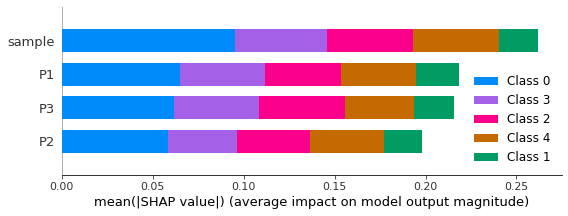

In [ ]:
shap.summary_plot(shap_values, X_test)

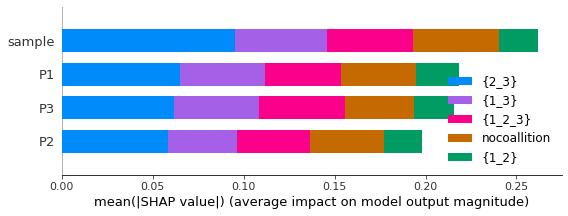

In [ ]:
# plot SHAP summary plot
shap.summary_plot(shap_values, X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

In [ ]:
shap_values[1][0:]

array([[-0.03183198, -0.00336463,  0.01689573, -0.00259811],
       [-0.01964716,  0.00029392, -0.00884937, -0.01269638],
       [ 0.00220907, -0.03713547, -0.00689009,  0.0009175 ],
       ...,
       [ 0.01448049, -0.00915523, -0.01272072, -0.02350353],
       [-0.00050815,  0.04026358,  0.03094535,  0.03006689],
       [-0.00157365,  0.00074852, -0.03910439, -0.00096947]])

# Class 0 | Class {2_3} summary plot from clean data

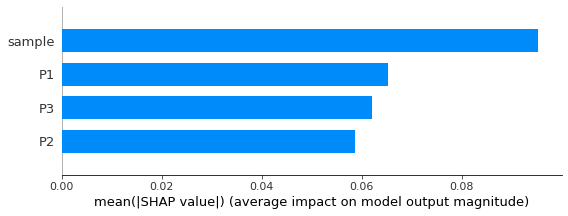

In [ ]:
shap.summary_plot(shap_values[0][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

# Class 1 | Class {2_3} summary plot from clean data

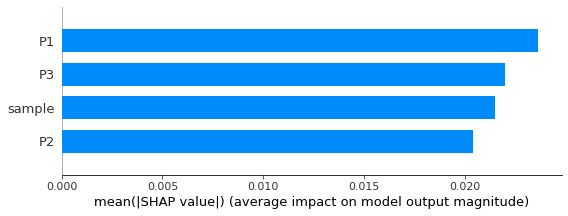

In [ ]:
shap.summary_plot(shap_values[1][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

# Class 2 | Class {2_3} summary plot from clean data

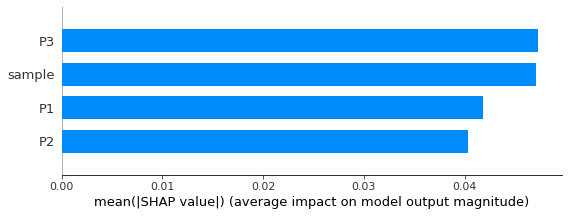

In [ ]:
shap.summary_plot(shap_values[2][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

# Class 3 | Class {2_3} summary plot from clean data

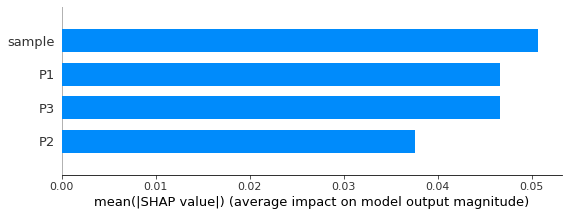

In [ ]:
shap.summary_plot(shap_values[3][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

# Class 4 | Class Nocoalition summary plot from clean data

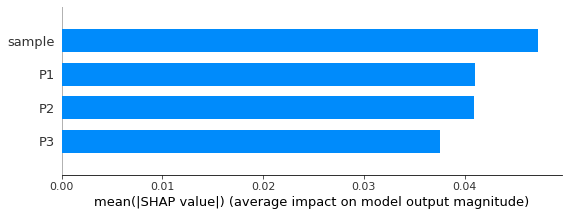

In [ ]:
shap.summary_plot(shap_values[4][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

## Force Plot

P1         10_8
P2         5_10
P3         9_10
sample    11_11
Name: 7938, dtype: object
{1_3}


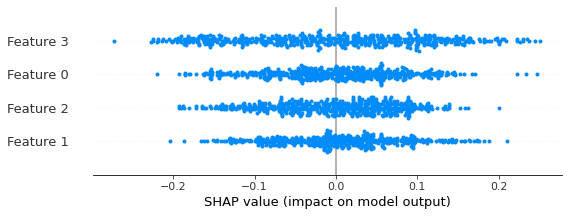

In [ ]:
output_index = 1

sample_index = 0
#print(X_test.iloc[0,:])
print(X_test.iloc[0,:])
print(y_test.iloc[0])
shap.summary_plot(shap_values[0])
# load the javascript libraries
shap.initjs()

shap.force_plot(explainer.expected_value[output_index], shap_values[output_index][:], X_test.iloc[:,:])


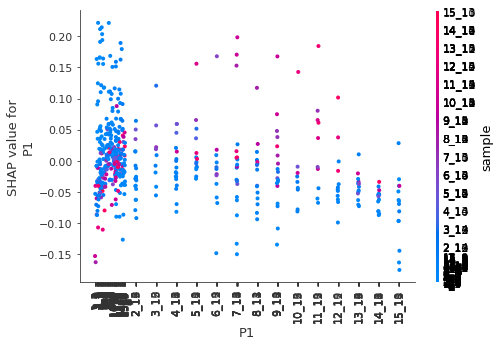

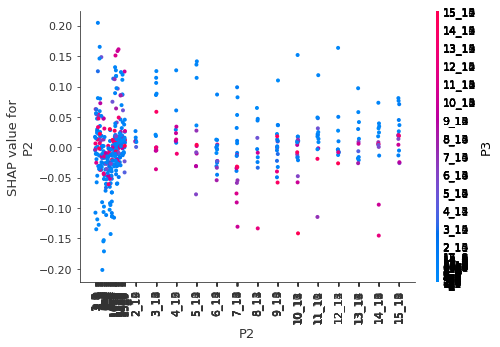

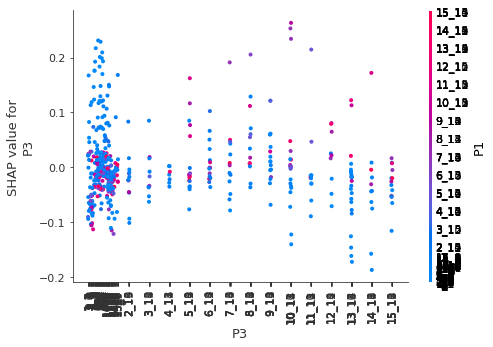

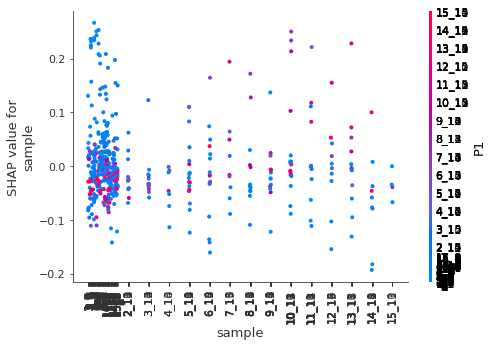

In [ ]:
# plot SHAP dependence ploy


# ax = plt.gca()
# ax.xaxis.set_ticklabels([])
# ax.xaxis.set_ticklabels(["2,15","3,15" ,"4,15", "5,15","6,15","7,15","8,15","9,15","10,15","11,15","12,15","13,15","14,15","15,15"])
# import matplotlib.pyplot as plt

#plt.rcParams["figure.figsize"] = fig_size
#shap.dependence_plot("age", shap_values, X)

shap.dependence_plot("P1", shap_values[3], X_test)
shap.dependence_plot("P2", shap_values[3], X_test)
shap.dependence_plot("P3", shap_values[3], X_test)
shap.dependence_plot("sample", shap_values[3], X_test)

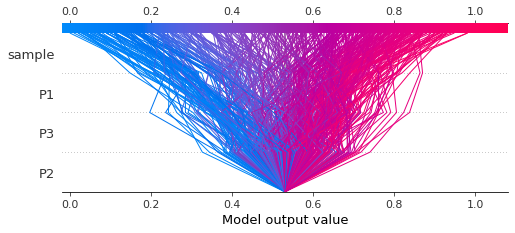

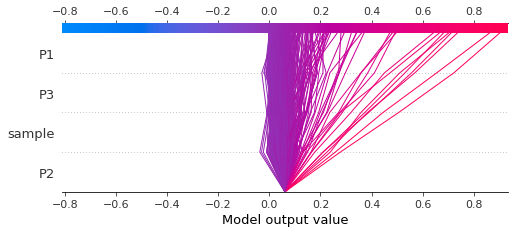

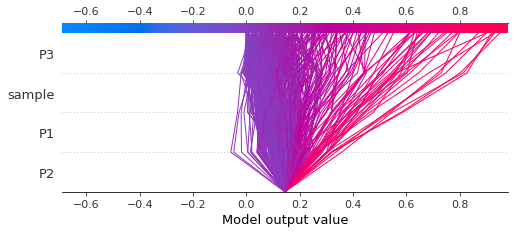

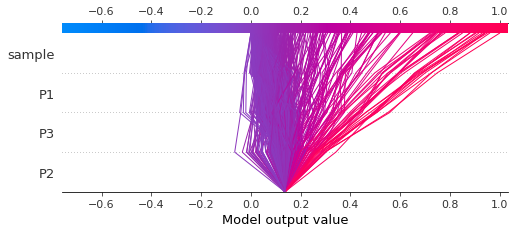

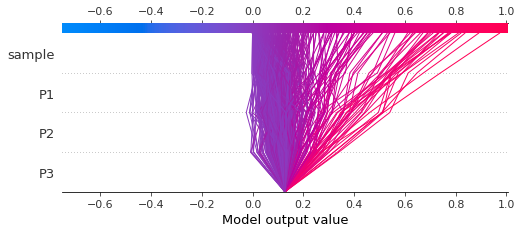

In [ ]:
sample_index = 0
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 1
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 2
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 3
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 4
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])


### ELI 5 Explainer

In [ ]:

# create an ELI5 explainer object
explainer = eli5.sklearn.explain_prediction.explain_prediction_sklearn(clf, X_test.iloc[4, :])

# display ELI5 explanation
display(explainer)

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

Explanation(estimator="RandomForestClassifier(criterion='entropy', oob_score=<class 'bool'>,\n                       random_state=0)", description='\nFeatures with largest coefficients per class.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target='nocoallition', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.53010101010101, std=None, value=1.0), FeatureWeight(feature='P2', weight=0.16170825057421107, std=None, value='2_1'), FeatureWeight(feature='P3', weight=0.01895636102360084, std=None, value='9_6'), FeatureWeight(feature='sample', weight=0.0006723258910061269, std=None, value='13_9')], neg=[FeatureWeight(feature='P1', weight=-0.06560461425649484, std=None, value='4_11')], pos_remaining=0, neg_remaining=0), proba=0.6458333333333335, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.06089898989898991, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.002465549689801107, std=None, value='4_11')], neg=[FeatureWeight(feature='P2', weight=-0.03020006891777111, std=None, value='2_1'), FeatureWeight(feature='sample', weight=-0.011771182655329244, std=None, value='13_9'), FeatureWeight(feature='P3', weight=-0.011393288015690653, std=None, value='9_6')], pos_remaining=0, neg_remaining=0), proba=0.01, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.14471212121212118, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.008271400617877851, std=None, value='4_11')], neg=[FeatureWeight(feature='P2', weight=-0.094618864539259, std=None, value='2_1'), FeatureWeight(feature='P3', weight=-0.010808716598682861, std=None, value='9_6'), FeatureWeight(feature='sample', weight=-0.007555940692057282, std=None, value='13_9')], pos_remaining=0, neg_remaining=0), proba=0.04, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.13686868686868692, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.06377224758378738, std=None, value='4_11'), FeatureWeight(feature='sample', weight=0.047782494398899956, std=None, value='13_9'), FeatureWeight(feature='P2', weight=0.02979738279102422, std=None, value='2_1')], neg=[FeatureWeight(feature='P3', weight=-0.010720811642398432, std=None, value='9_6')], pos_remaining=0, neg_remaining=0), proba=0.2675, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.1274191919191919, std=None, value=1.0), FeatureWeight(feature='P3', weight=0.013966455233171114, std=None, value='9_6')], neg=[FeatureWeight(feature='P2', weight=-0.0666866999082053, std=None, value='2

## LABEL FLIPPING

In [ ]:
df_train = X_train
df_train['coallition']= y_train
df_train
df_train= df_train.reset_index()
df_train =df_train.drop(['index'],axis=1)


In [ ]:
# Saving df_train for flipping
df_train.to_csv('C:\\Users\\Rasheed\\Documents\\Game_theory_coalition\\data_to_flip.csv', index=False)


In [ ]:
def flip_class_labels(df, flip_pct):
    """
    Function to flip class labels in a DataFrame by a given percentage.
    :param df: pandas DataFrame containing the data
    :param flip_pct: float between 0 and 1, representing the percentage of class labels to flip
    :return: DataFrame with class labels flipped
    """
    # Create a copy of the DataFrame
    df_flipped = df.copy()
    # Get the number of rows in the DataFrame
    n_rows = df_flipped.shape[0]
    #print(n_rows)
    # Get the number of class labels to flip
    n_flip = int(flip_pct * n_rows)
    #print(n_flip)
    # Get the indices of the rows to flip
    flip_indices = np.random.choice(range(n_rows), size=n_flip, replace=False)
    flip_indices=flip_indices.tolist()
    # Get the column name that contains the class labels
    label_col = 'coallition'
    #Get the coalition to flip
    coalition_to_shuffle= df_flipped.iloc[flip_indices, 4].tolist()
    # Shuffle
    random.shuffle (coalition_to_shuffle)
    #print
    d = {'coallition': coalition_to_shuffle}
    df_shuffled= pd.DataFrame(data=d, index= flip_indices)
    # Flip the class labels at the chosen indices
    df_flipped.loc[df_shuffled.index, 'coallition'] = df_shuffled['coallition']
    #df_flipped.loc[flip_indices, label_col] = df_flipped.loc[flip_indices, label_col].apply(lambda x: [y for y in x if y != 5])
    return df_flipped

Flip 5 percent

In [ ]:
# Example usage
flip_pct = 0.05
df_flipped=flip_class_labels(df_train, flip_pct)

In [ ]:
df_flipped

,P1,P2,P3,sample,coallition
0,9_15,2_14,8_5,11_12,nocoallition
1,13_2,1_6,8_4,11_8,nocoallition
2,5_6,3_6,4_6,13_11,nocoallition
3,12_7,1_1,8_12,5_6,nocoallition
4,8_7,10_4,11_15,14_15,nocoallition
...,...,...,...,...,...
1975,9_15,4_10,12_7,3_14,nocoallition
1976,11_9,4_9,1_7,1_13,nocoallition
1977,14_10,14_14,6_15,9_14,nocoallition
1978,12_5,12_9,1_7,5_14,nocoallition


In [ ]:
X_train1 = df_flipped.drop(["coallition"], axis=1)
y_train1 = df_flipped["coallition"]


In [ ]:
# Train a Random Forest classifier on the training data
clf1 = RandomForestClassifier(n_estimators=100, random_state=0,criterion="entropy",oob_score=bool)
clf1.fit(X_train1, y_train1)

accuracy = clf1.score(X_test, y_test)
print(f"Test accuracy: {accuracy:.2f}")

Test accuracy: 0.69


In [ ]:
y_pred1=clf1.predict(X_test)

In [ ]:
y_pred1

array(['nocoallition', 'nocoallition', 'nocoallition', 'nocoallition',
       'nocoallition', 'nocoallition', 'nocoallition', 'nocoallition',
       'nocoallition', '{1_3}', '{1_3}', 'nocoallition', '{1_2}',
       'nocoallition', 'nocoallition', 'nocoallition', '{2_3}', '{2_3}',
       'nocoallition', 'nocoallition', '{1_2}', 'nocoallition', '{1_2}',
       '{1_3}', 'nocoallition', '{2_3}', 'nocoallition', 'nocoallition',
       'nocoallition', 'nocoallition', 'nocoallition', 'nocoallition',
       'nocoallition', 'nocoallition', '{1_3}', 'nocoallition',
       'nocoallition', '{2_3}', '{1_2}', 'nocoallition', 'nocoallition',
       '{1_3}', 'nocoallition', 'nocoallition', 'nocoallition',
       'nocoallition', 'nocoallition', 'nocoallition', '{1_2}',
       'nocoallition', 'nocoallition', 'nocoallition', 'nocoallition',
       'nocoallition', 'nocoallition', 'nocoallition', 'nocoallition',
       'nocoallition', 'nocoallition', 'nocoallition', '{1_2}', '{1_3}',
       'nocoallition',

In [ ]:
y_pred1=clf1.predict(X_test)
np.unique(y_pred1, return_counts=True)

(array(['nocoallition', '{1_2_3}', '{1_2}', '{1_3}', '{2_3}'], dtype=object),
 array([349,  14,  44,  51,  37]))

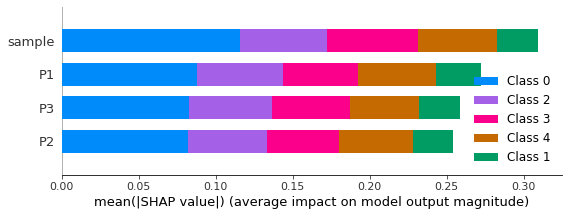

In [ ]:
# create a SHAP explainer object
explainer = shap.TreeExplainer(clf1)
# compute SHAP values
shap_values1 = explainer.shap_values(X_train1)
# plot SHAP summary plot
shap.summary_plot(shap_values1, X_train1)


In [ ]:
shap_values1

[array([[ 0.00979898,  0.10810713,  0.12786493,  0.12390068],
        [ 0.03280846,  0.23042841,  0.01665149,  0.07173573],
        [ 0.09045989,  0.04032036,  0.05878148,  0.28010999],
        ...,
        [ 0.09625405,  0.03460561,  0.04645345,  0.00235861],
        [ 0.12162007,  0.08244322,  0.0832343 ,  0.08058841],
        [-0.10348252, -0.0982043 , -0.03626723, -0.15237423]]),
 array([[-0.00172666, -0.00341381, -0.04041318, -0.00519383],
        [-0.01641648, -0.03385176, -0.00932753, -0.00115171],
        [ 0.01596844,  0.00614186,  0.01335842, -0.0962162 ],
        ...,
        [ 0.02606531,  0.01412373, -0.02695045,  0.00601394],
        [-0.02604198, -0.00475499, -0.02049982, -0.00945069],
        [ 0.01720618,  0.02042833,  0.0106259 , -0.01900788]]),
 array([[ 0.01522275, -0.06260985, -0.0242155 , -0.01307922],
        [-0.0217007 , -0.09404679, -0.02461492, -0.00431941],
        [-0.03483767,  0.0018609 , -0.01699985, -0.0947052 ],
        ...,
        [-0.03265973, -0.00

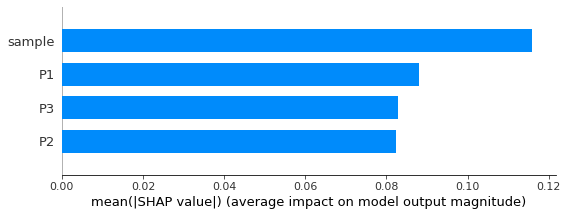

In [ ]:
shap.summary_plot(shap_values1[0][0:], X_train1,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

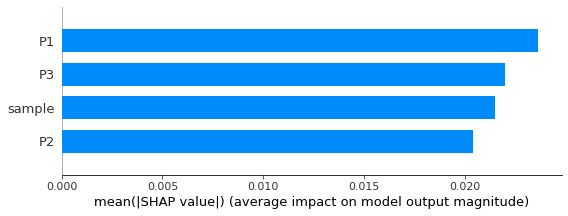

In [ ]:
shap.summary_plot(shap_values[1][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

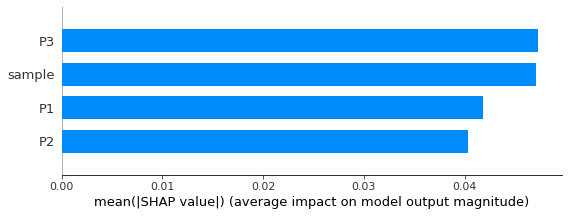

In [ ]:
shap.summary_plot(shap_values[2][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

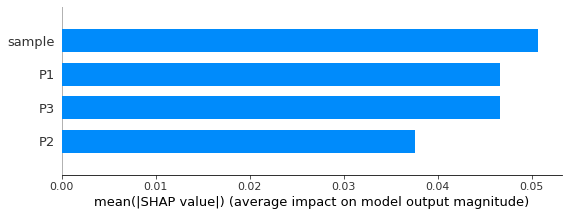

In [ ]:
shap.summary_plot(shap_values[3][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

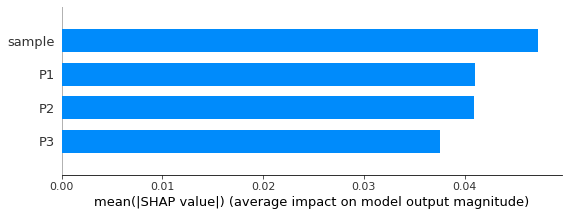

In [ ]:
shap.summary_plot(shap_values[4][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

In [ ]:
output_index = 1

sample_index = 0
# load the javascript libraries
shap.initjs()

shap.force_plot(explainer.expected_value[output_index], shap_values[output_index][sample_index], X_test.iloc[sample_index,:])


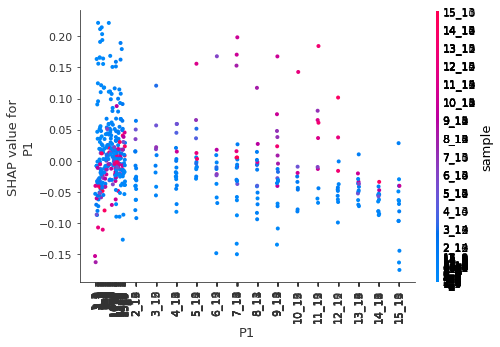

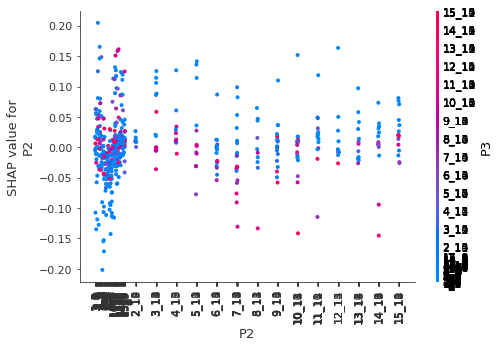

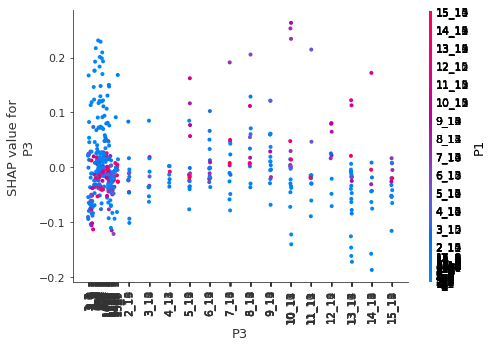

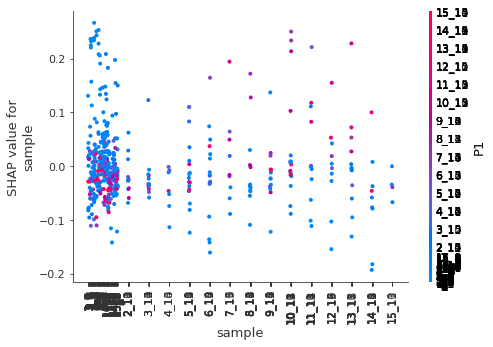

In [ ]:
# plot SHAP dependence ploy


# ax = plt.gca()
# ax.xaxis.set_ticklabels([])
# ax.xaxis.set_ticklabels(["2,15","3,15" ,"4,15", "5,15","6,15","7,15","8,15","9,15","10,15","11,15","12,15","13,15","14,15","15,15"])
# import matplotlib.pyplot as plt

#plt.rcParams["figure.figsize"] = fig_size
#shap.dependence_plot("age", shap_values, X)

shap.dependence_plot("P1", shap_values[3], X_test)
shap.dependence_plot("P2", shap_values[3], X_test)
shap.dependence_plot("P3", shap_values[3], X_test)
shap.dependence_plot("sample", shap_values[3], X_test)

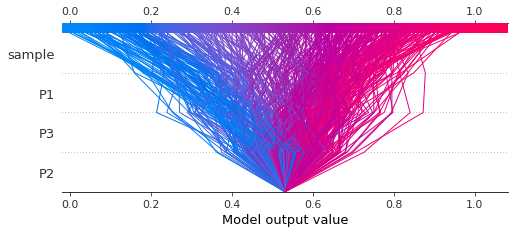

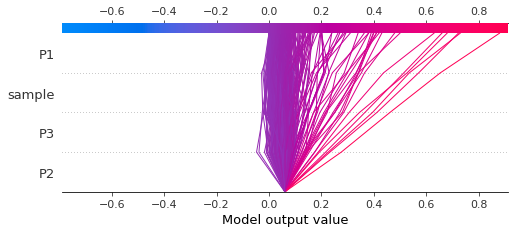

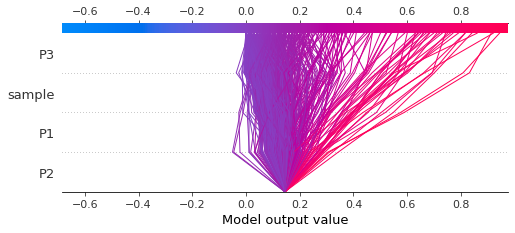

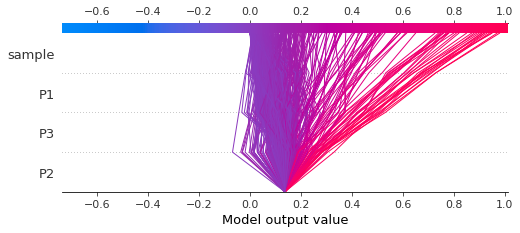

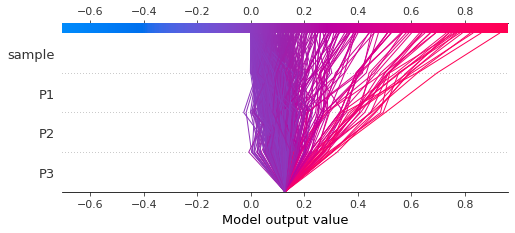

In [ ]:
sample_index = 0
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 1
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 2
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 3
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 4
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])


In [ ]:

# create an ELI5 explainer object
explainer = eli5.sklearn.explain_prediction.explain_prediction_sklearn(clf1, X_test.iloc[4, :])

# display ELI5 explanation
display(explainer)

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

Explanation(estimator="RandomForestClassifier(criterion='entropy', oob_score=<class 'bool'>,\n                       random_state=0)", description='\nFeatures with largest coefficients per class.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target='nocoallition', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.5304949494949494, std=None, value=1.0), FeatureWeight(feature='P2', weight=0.13284644668433407, std=None, value='2_1'), FeatureWeight(feature='P3', weight=0.040459678126400375, std=None, value='9_6'), FeatureWeight(feature='sample', weight=0.022276997548518182, std=None, value='13_9')], neg=[FeatureWeight(feature='P1', weight=-0.041078071854202126, std=None, value='4_11')], pos_remaining=0, neg_remaining=0), proba=0.685, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.06093434343434342, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.028962778925588836, std=None, value='4_11')], neg=[FeatureWeight(feature='P2', weight=-0.02533331363707576, std=None, value='2_1'), FeatureWeight(feature='sample', weight=-0.015808567079210665, std=None, value='13_9'), FeatureWeight(feature='P3', weight=-0.008755241643645887, std=None, value='9_6')], pos_remaining=0, neg_remaining=0), proba=0.04, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.14474747474747468, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.0177228933513412, std=None, value='4_11')], neg=[FeatureWeight(feature='P2', weight=-0.061569659412969324, std=None, value='2_1'), FeatureWeight(feature='P3', weight=-0.03673624430141123, std=None, value='9_6'), FeatureWeight(feature='sample', weight=-0.02416446438443541, std=None, value='13_9')], pos_remaining=0, neg_remaining=0), proba=0.04, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.13662121212121212, std=None, value=1.0), FeatureWeight(feature='P2', weight=0.02644502359539573, std=None, value='2_1'), FeatureWeight(feature='sample', weight=0.01571982666804924, std=None, value='13_9'), FeatureWeight(feature='P1', weight=0.014646764361388485, std=None, value='4_11')], neg=[FeatureWeight(feature='P3', weight=-0.008432826746045579, std=None, value='9_6')], pos_remaining=0, neg_remaining=0), proba=0.185, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.1272020202020202, std=None, value=1.0), FeatureWeight(feature='P3', weight=0.013464634564702259, std=None, value='9_6'), FeatureWeight(feature='sample', weight=0.001976207247078682, std=None, value='13_9')], neg=[

Flip 10 percent

In [ ]:
# Example usage
flip_pct = 0.10
df_flipped=flip_class_labels(df_train, flip_pct)

In [ ]:
X_train1 = df_flipped.drop(["coallition"], axis=1)
y_train1 = df_flipped["coallition"]


In [ ]:
# Train a Random Forest classifier on the training data
clf2 = RandomForestClassifier(n_estimators=100, random_state=0,criterion="entropy",oob_score=bool)
clf2.fit(X_train1, y_train1)

accuracy = clf2.score(X_test, y_test)
print(f"Test accuracy: {accuracy:.2f}")

Test accuracy: 0.71


In [ ]:
y_pred2=clf2.predict(X_test)
np.unique(y_pred2, return_counts=True)

(array(['nocoallition', '{1_2_3}', '{1_2}', '{1_3}', '{2_3}'], dtype=object),
 array([339,  15,  44,  53,  44]))

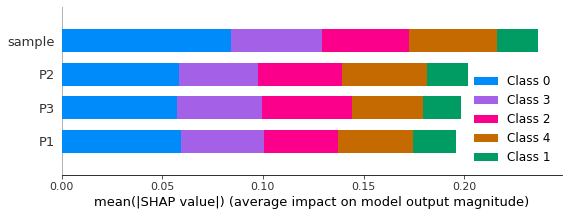

In [ ]:
# create a SHAP explainer object
explainer = shap.TreeExplainer(clf2)
# compute SHAP values
shap_values = explainer.shap_values(X_test)
# plot SHAP summary plot
shap.summary_plot(shap_values, X_test)


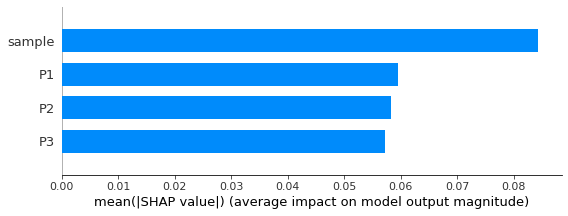

In [ ]:
shap.summary_plot(shap_values[0][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

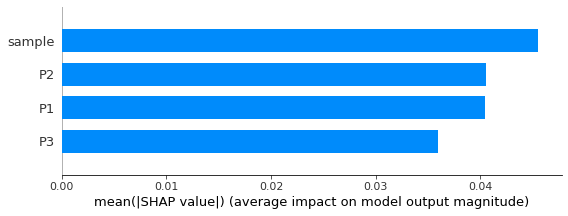

In [ ]:
shap.summary_plot(shap_values[4][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

In [ ]:
output_index = 1

sample_index = 0
# load the javascript libraries
shap.initjs()

#shap.force_plot(explainer.expected_value[output_index], shap_values[output_index][sample_index], X_test.iloc[sample_index,:])
shap.force_plot(explainer.expected_value[output_index], shap_values[output_index][:], X_test.iloc[:,:])


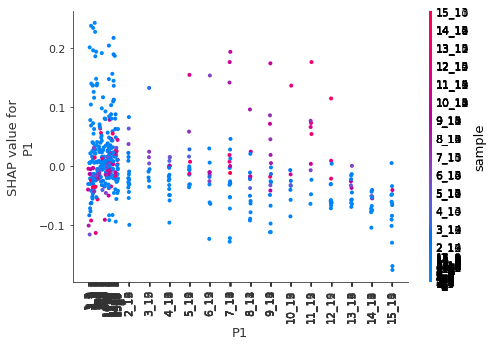

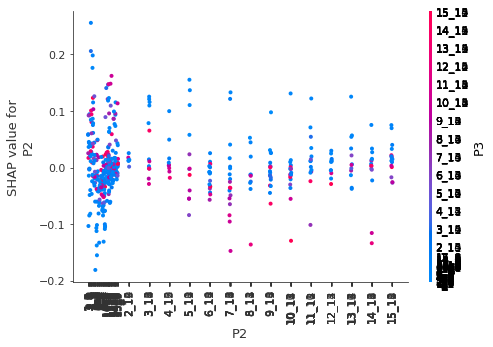

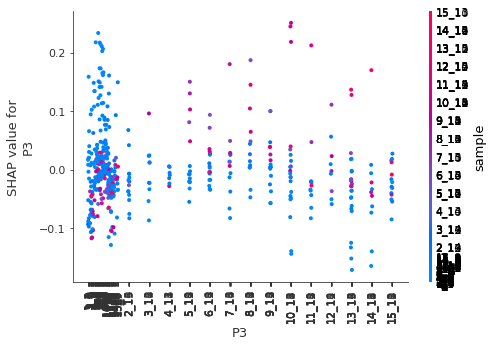

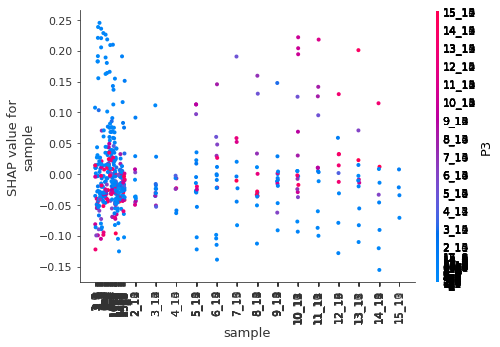

In [ ]:
# plot SHAP dependence ploy


# ax = plt.gca()
# ax.xaxis.set_ticklabels([])
# ax.xaxis.set_ticklabels(["2,15","3,15" ,"4,15", "5,15","6,15","7,15","8,15","9,15","10,15","11,15","12,15","13,15","14,15","15,15"])
# import matplotlib.pyplot as plt

#plt.rcParams["figure.figsize"] = fig_size
#shap.dependence_plot("age", shap_values, X)

shap.dependence_plot("P1", shap_values[3], X_test)
shap.dependence_plot("P2", shap_values[3], X_test)
shap.dependence_plot("P3", shap_values[3], X_test)
shap.dependence_plot("sample", shap_values[3], X_test)

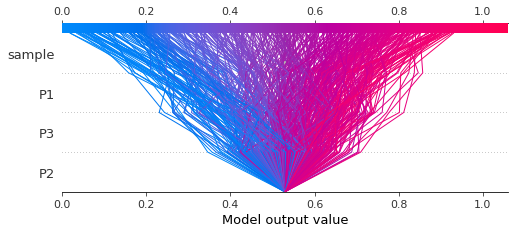

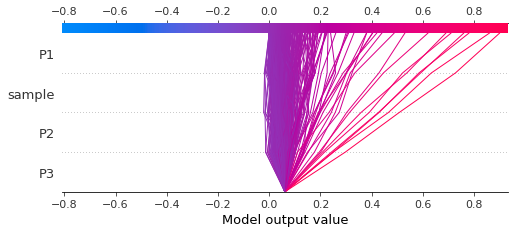

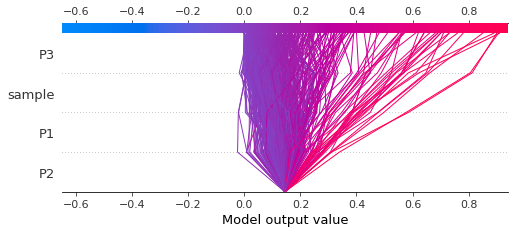

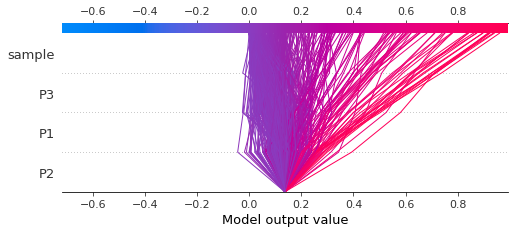

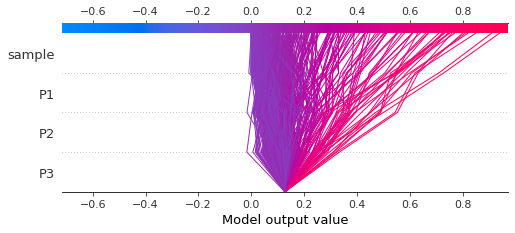

In [ ]:
sample_index = 0
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 1
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 2
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 3
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 4
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])


In [ ]:

# create an ELI5 explainer object
explainer = eli5.sklearn.explain_prediction.explain_prediction_sklearn(clf2, X_test.iloc[4, :])

# display ELI5 explanation
display(explainer)

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

Explanation(estimator="RandomForestClassifier(criterion='entropy', oob_score=<class 'bool'>,\n                       random_state=0)", description='\nFeatures with largest coefficients per class.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target='nocoallition', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.5296464646464645, std=None, value=1.0), FeatureWeight(feature='P2', weight=0.14133664146253808, std=None, value='2_1'), FeatureWeight(feature='P3', weight=0.04512660765938847, std=None, value='9_6')], neg=[FeatureWeight(feature='P1', weight=-0.04835399075173522, std=None, value='4_11'), FeatureWeight(feature='sample', weight=-0.005755723016655929, std=None, value='13_9')], pos_remaining=0, neg_remaining=0), proba=0.662, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.06134848484848487, std=None, value=1.0), FeatureWeight(feature='sample', weight=0.0004424203353875264, std=None, value='13_9')], neg=[FeatureWeight(feature='P2', weight=-0.03177441961526945, std=None, value='2_1'), FeatureWeight(feature='P3', weight=-0.00875292448612061, std=None, value='9_6'), FeatureWeight(feature='P1', weight=-0.00126356108248231, std=None, value='4_11')], pos_remaining=0, neg_remaining=0), proba=0.02, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.14467676767676765, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.03411927441186578, std=None, value='4_11')], neg=[FeatureWeight(feature='P2', weight=-0.0662388632973145, std=None, value='2_1'), FeatureWeight(feature='sample', weight=-0.02492142242561776, std=None, value='13_9'), FeatureWeight(feature='P3', weight=-0.007635756365701152, std=None, value='9_6')], pos_remaining=0, neg_remaining=0), proba=0.08, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.1369292929292929, std=None, value=1.0), FeatureWeight(feature='sample', weight=0.03869698389633388, std=None, value='13_9'), FeatureWeight(feature='P1', weight=0.023123966390467033, std=None, value='4_11'), FeatureWeight(feature='P2', weight=0.022647192280728878, std=None, value='2_1')], neg=[FeatureWeight(feature='P3', weight=-0.03139743549682269, std=None, value='9_6')], pos_remaining=0, neg_remaining=0), proba=0.19, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.12739898989898987, std=None, value=1.0), FeatureWeight(feature='P3', weight=0.0026595086892559944, std=None, value='9_6')], neg=[FeatureWeight(feature='P2', weight=-0.06597055083068294, std=None, value='2_1'), Feature

Flip 15 percent

In [ ]:
# Example usage
flip_pct = 0.15
df_flipped=flip_class_labels(df_train, flip_pct)

In [ ]:
X_train1 = df_flipped.drop(["coallition"], axis=1)
y_train1 = df_flipped["coallition"]


In [ ]:
# Train a Random Forest classifier on the training data
clf3 = RandomForestClassifier(n_estimators=100, random_state=0,criterion="entropy",oob_score=bool)
clf3.fit(X_train1, y_train1)

accuracy = clf3.score(X_test, y_test)
print(f"Test accuracy: {accuracy:.2f}")

Test accuracy: 0.69


In [ ]:
y_pred3=clf3.predict(X_test)
np.unique(y_pred3, return_counts=True)

(array(['nocoallition', '{1_2_3}', '{1_2}', '{1_3}', '{2_3}'], dtype=object),
 array([348,  11,  42,  55,  39]))

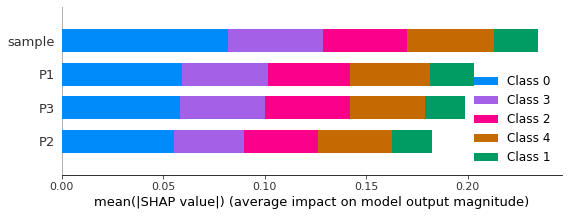

In [ ]:
# create a SHAP explainer object
explainer = shap.TreeExplainer(clf3)
# compute SHAP values
shap_values = explainer.shap_values(X_test)
# plot SHAP summary plot
shap.summary_plot(shap_values, X_test)

In [ ]:
output_index = 1

sample_index = 0
# load the javascript libraries
shap.initjs()

shap.force_plot(explainer.expected_value[output_index], shap_values[output_index][sample_index], X_test.iloc[sample_index,:])


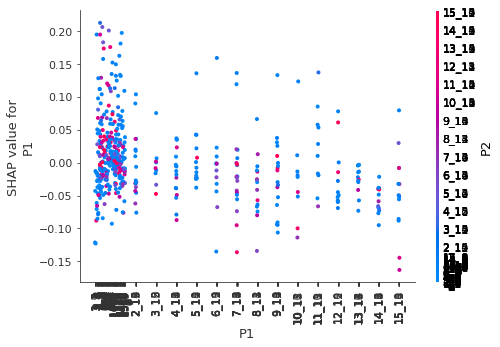

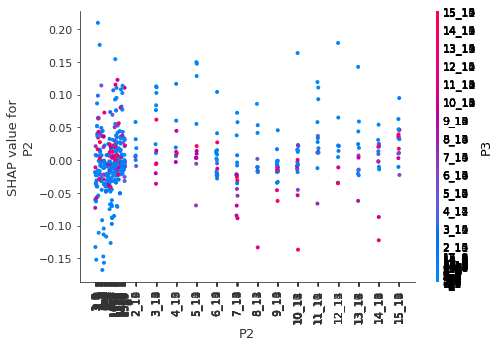

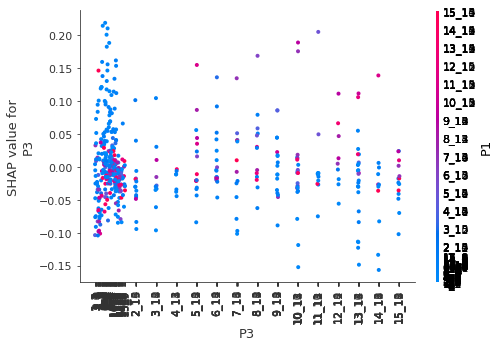

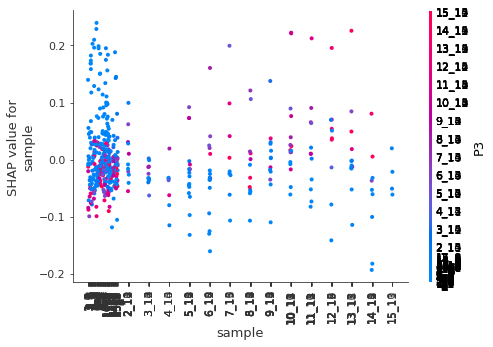

In [ ]:
# plot SHAP dependence ploy


# ax = plt.gca()
# ax.xaxis.set_ticklabels([])
# ax.xaxis.set_ticklabels(["2,15","3,15" ,"4,15", "5,15","6,15","7,15","8,15","9,15","10,15","11,15","12,15","13,15","14,15","15,15"])
# import matplotlib.pyplot as plt

#plt.rcParams["figure.figsize"] = fig_size
#shap.dependence_plot("age", shap_values, X)

shap.dependence_plot("P1", shap_values[3], X_test)
shap.dependence_plot("P2", shap_values[3], X_test)
shap.dependence_plot("P3", shap_values[3], X_test)
shap.dependence_plot("sample", shap_values[3], X_test)

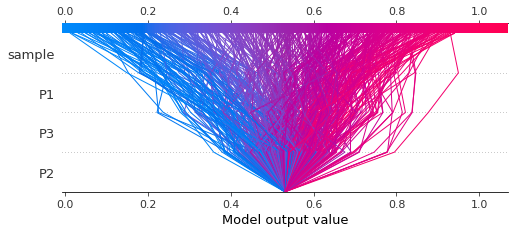

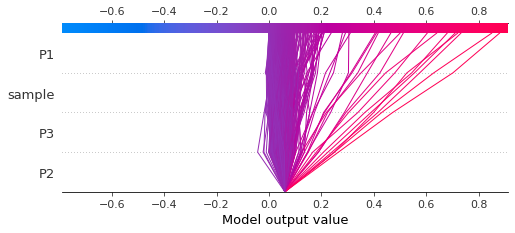

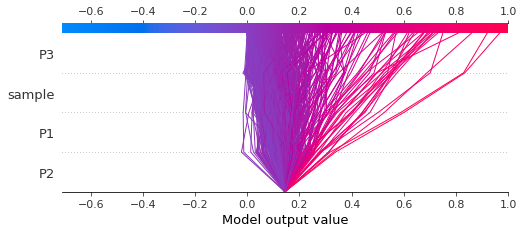

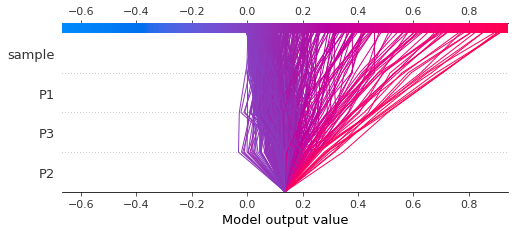

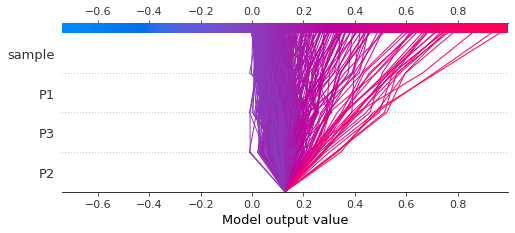

In [ ]:
sample_index = 0
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 1
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 2
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 3
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 4
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

In [ ]:
# create an ELI5 explainer object
explainer = eli5.sklearn.explain_prediction.explain_prediction_sklearn(clf3, X_test.iloc[4, :])

# display ELI5 explanation
display(explainer)

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

Explanation(estimator="RandomForestClassifier(criterion='entropy', oob_score=<class 'bool'>,\n                       random_state=0)", description='\nFeatures with largest coefficients per class.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target='nocoallition', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.5306616161616161, std=None, value=1.0), FeatureWeight(feature='P2', weight=0.03418612607816917, std=None, value='2_1'), FeatureWeight(feature='sample', weight=0.016839169520371833, std=None, value='13_9')], neg=[FeatureWeight(feature='P3', weight=-0.039238496869530036, std=None, value='9_6'), FeatureWeight(feature='P1', weight=-0.0031627006049128204, std=None, value='4_11')], pos_remaining=0, neg_remaining=0), proba=0.5392857142857143, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.06079797979797981, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.0012945275974218671, std=None, value='4_11')], neg=[FeatureWeight(feature='P2', weight=-0.034095127297441116, std=None, value='2_1'), FeatureWeight(feature='sample', weight=-0.01471768477860571, std=None, value='13_9'), FeatureWeight(feature='P3', weight=-0.003279695319354823, std=None, value='9_6')], pos_remaining=0, neg_remaining=0), proba=0.01, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.14449494949494948, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.023656444622635053, std=None, value='4_11')], neg=[FeatureWeight(feature='P2', weight=-0.04448549972561112, std=None, value='2_1'), FeatureWeight(feature='P3', weight=-0.04193263606485501, std=None, value='9_6'), FeatureWeight(feature='sample', weight=-0.021733258327118424, std=None, value='13_9')], pos_remaining=0, neg_remaining=0), proba=0.06, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.13631313131313133, std=None, value=1.0), FeatureWeight(feature='P2', weight=0.09335780078851459, std=None, value='2_1'), FeatureWeight(feature='P3', weight=0.06737095006620951, std=None, value='9_6'), FeatureWeight(feature='P1', weight=0.0039230999711907825, std=None, value='4_11')], neg=[FeatureWeight(feature='sample', weight=-0.0102506964247605, std=None, value='13_9')], pos_remaining=0, neg_remaining=0), proba=0.2907142857142857, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.12773232323232325, std=None, value=1.0), FeatureWeight(feature='sample', weight=0.029862470010112774, std=None, value='13_9'), FeatureWeight(feature='P3', weight=0.017079878187530352,

Flip 20 percent

In [ ]:
# Example usage
flip_pct = 0.20
df_flipped=flip_class_labels(df_train, flip_pct)

In [ ]:
X_train1 = df_flipped.drop(["coallition"], axis=1)
y_train1 = df_flipped["coallition"]


In [ ]:
# Train a Random Forest classifier on the training data
clf4 = RandomForestClassifier(n_estimators=100, random_state=0,criterion="entropy",oob_score=bool)
clf4.fit(X_train1, y_train1)

accuracy = clf4.score(X_test, y_test)
print(f"Test accuracy: {accuracy:.2f}")

Test accuracy: 0.68


In [ ]:
y_pred4=clf4.predict(X_test)
np.unique(y_pred4, return_counts=True)

(array(['nocoallition', '{1_2_3}', '{1_2}', '{1_3}', '{2_3}'], dtype=object),
 array([357,  14,  40,  44,  40]))

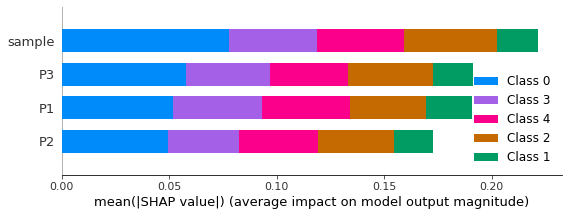

In [ ]:
# create a SHAP explainer object
explainer = shap.TreeExplainer(clf4)
# compute SHAP values
shap_values = explainer.shap_values(X_test)
# plot SHAP summary plot
shap.summary_plot(shap_values, X_test)

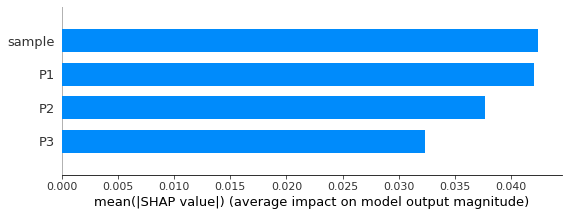

In [ ]:
shap.summary_plot(shap_values[4][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

In [ ]:
output_index = 1

sample_index = 0
# load the javascript libraries
shap.initjs()

#shap.force_plot(explainer.expected_value[output_index], shap_values[output_index][sample_index], X_test.iloc[sample_index,:])
shap.force_plot(explainer.expected_value[output_index], shap_values[output_index][:], X_test.iloc[:,:])


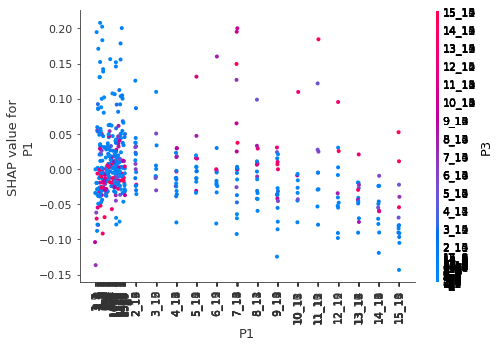

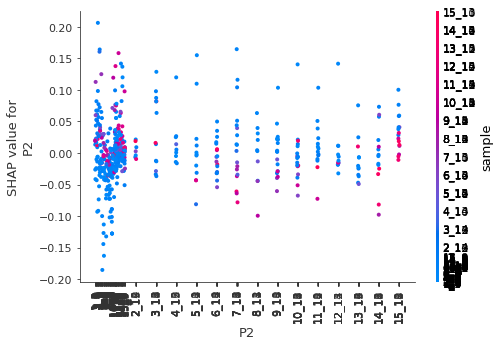

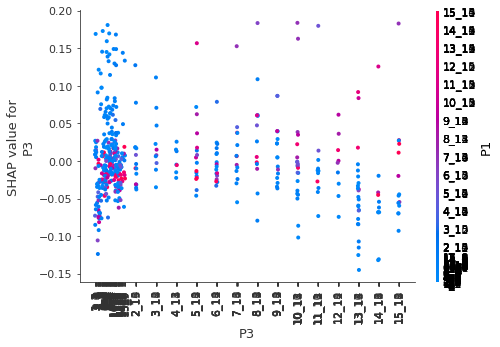

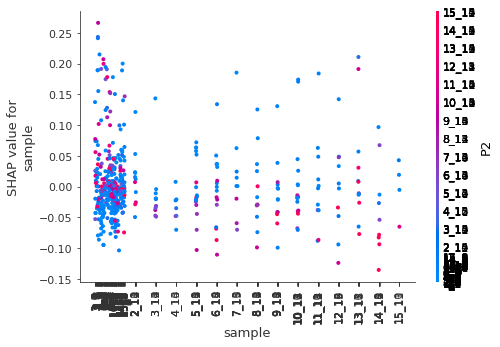

In [ ]:
# plot SHAP dependence ploy


# ax = plt.gca()
# ax.xaxis.set_ticklabels([])
# ax.xaxis.set_ticklabels(["2,15","3,15" ,"4,15", "5,15","6,15","7,15","8,15","9,15","10,15","11,15","12,15","13,15","14,15","15,15"])
# import matplotlib.pyplot as plt

#plt.rcParams["figure.figsize"] = fig_size
#shap.dependence_plot("age", shap_values, X)

shap.dependence_plot("P1", shap_values[3], X_test)
shap.dependence_plot("P2", shap_values[3], X_test)
shap.dependence_plot("P3", shap_values[3], X_test)
shap.dependence_plot("sample", shap_values[3], X_test)

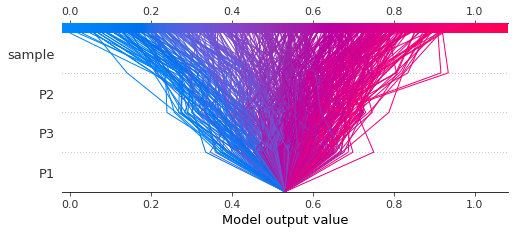

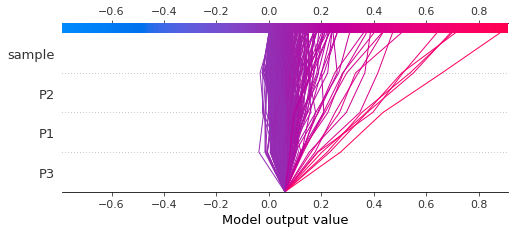

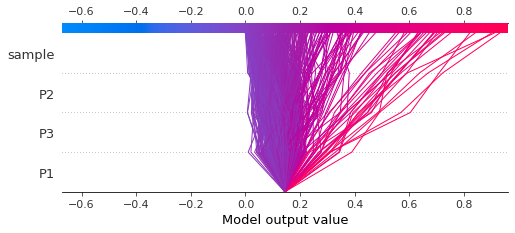

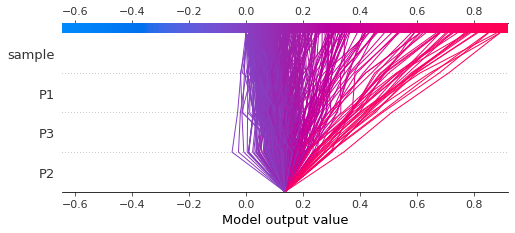

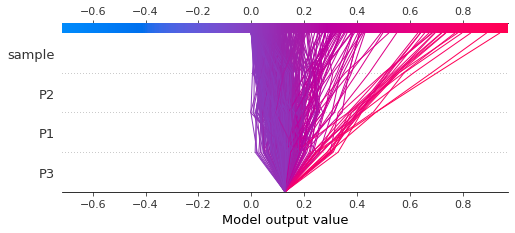

In [ ]:
sample_index = 0
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 1
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 2
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 3
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 4
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

In [ ]:
# create an ELI5 explainer object
explainer = eli5.sklearn.explain_prediction.explain_prediction_sklearn(clf4, X_test.iloc[4, :])

# display ELI5 explanation
display(explainer)

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

Explanation(estimator="RandomForestClassifier(criterion='entropy', oob_score=<class 'bool'>,\n                       random_state=0)", description='\nFeatures with largest coefficients per class.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target='nocoallition', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.5303131313131315, std=None, value=1.0), FeatureWeight(feature='P2', weight=0.06681682343412032, std=None, value='2_1'), FeatureWeight(feature='P3', weight=0.032155158002563085, std=None, value='9_6')], neg=[FeatureWeight(feature='sample', weight=-0.04045177428606405, std=None, value='13_9'), FeatureWeight(feature='P1', weight=-0.015500005130417363, std=None, value='4_11')], pos_remaining=0, neg_remaining=0), proba=0.5733333333333334, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.06105555555555558, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.0035813963589981313, std=None, value='4_11')], neg=[FeatureWeight(feature='P2', weight=-0.025583541531934154, std=None, value='2_1'), FeatureWeight(feature='sample', weight=-0.005451766380323296, std=None, value='13_9'), FeatureWeight(feature='P3', weight=-0.003601644002296258, std=None, value='9_6')], pos_remaining=0, neg_remaining=0), proba=0.03, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.1443636363636364, std=None, value=1.0)], neg=[FeatureWeight(feature='P3', weight=-0.04028423213800087, std=None, value='9_6'), FeatureWeight(feature='sample', weight=-0.04000343512795841, std=None, value='13_9'), FeatureWeight(feature='P2', weight=-0.019423873110610914, std=None, value='2_1'), FeatureWeight(feature='P1', weight=-0.0046520959870661625, std=None, value='4_11')], pos_remaining=0, neg_remaining=0), proba=0.04, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='sample', weight=0.16012172728187118, std=None, value='13_9'), FeatureWeight(feature='<BIAS>', weight=0.13673232323232326, std=None, value=1.0), FeatureWeight(feature='P2', weight=0.03130056623212214, std=None, value='2_1'), FeatureWeight(feature='P1', weight=0.009246094783174081, std=None, value='4_11')], neg=[FeatureWeight(feature='P3', weight=-0.0007340448628240699, std=None, value='9_6')], pos_remaining=0, neg_remaining=0), proba=0.3366666666666667, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.12753535353535353, std=None, value=1.0), FeatureWeight(feature='P3', weight=0.012464763000558104, std=None, value='9_6'), FeatureWeight(feature='P1', weight=0.007324609975311312, st

Flip 30 percent

In [ ]:
# Example usage
flip_pct = 0.30
df_flipped=flip_class_labels(df_train, flip_pct)

In [ ]:
X_train1 = df_flipped.drop(["coallition"], axis=1)
y_train1 = df_flipped["coallition"]


In [ ]:
# Train a Random Forest classifier on the training data
clf5 = RandomForestClassifier(n_estimators=100, random_state=0,criterion="entropy",oob_score=bool)
clf5.fit(X_train1, y_train1)

accuracy = clf5.score(X_test, y_test)
print(f"Test accuracy: {accuracy:.2f}")

Test accuracy: 0.67


In [ ]:
y_pred5=clf5.predict(X_test)
np.unique(y_pred5, return_counts=True)

(array(['nocoallition', '{1_2_3}', '{1_2}', '{1_3}', '{2_3}'], dtype=object),
 array([368,  10,  38,  45,  34]))

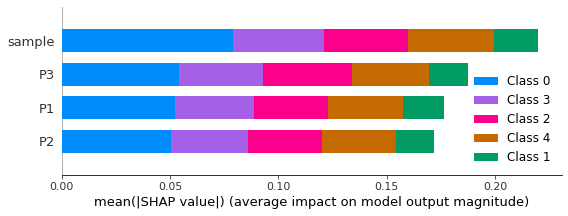

In [ ]:
# create a SHAP explainer object
explainer = shap.TreeExplainer(clf5)
# compute SHAP values
shap_values = explainer.shap_values(X_test)
# plot SHAP summary plot
shap.summary_plot(shap_values, X_test)

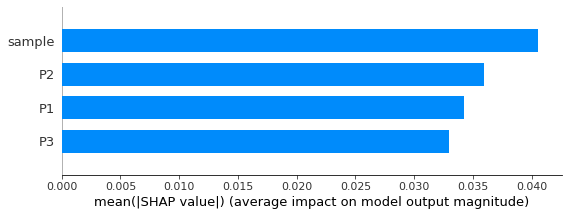

In [ ]:
shap.summary_plot(shap_values[4][:], X_test,class_names=['{2_3}', '{1_2}', '{1_2_3}', '{1_3}', 'nocoallition'], plot_type='bar')

In [ ]:
output_index = 1

sample_index = 0
# load the javascript libraries
shap.initjs()

shap.force_plot(explainer.expected_value[output_index], shap_values[output_index][sample_index], X_test.iloc[sample_index,:])
shap.force_plot(explainer.expected_value[output_index], shap_values[output_index][:], X_test.iloc[:,:])



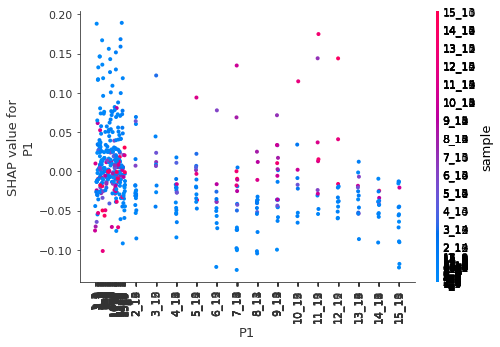

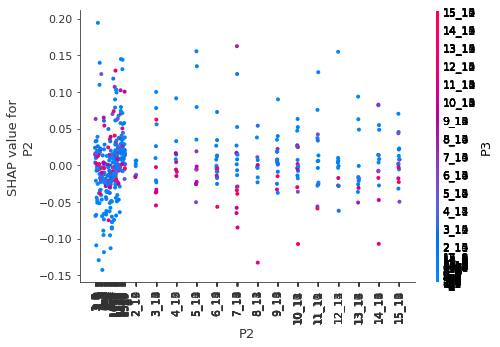

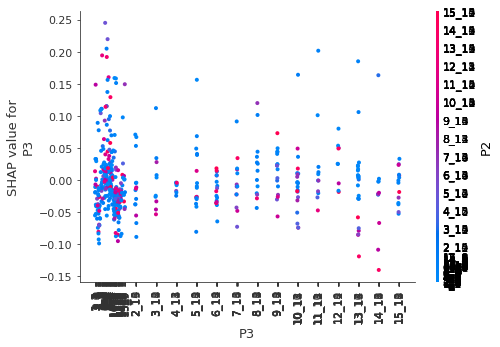

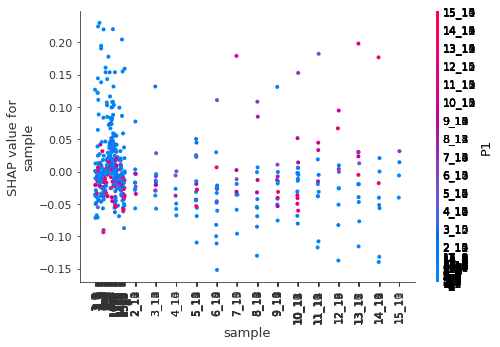

In [ ]:
# plot SHAP dependence ploy


# ax = plt.gca()
# ax.xaxis.set_ticklabels([])
# ax.xaxis.set_ticklabels(["2,15","3,15" ,"4,15", "5,15","6,15","7,15","8,15","9,15","10,15","11,15","12,15","13,15","14,15","15,15"])
# import matplotlib.pyplot as plt

#plt.rcParams["figure.figsize"] = fig_size
#shap.dependence_plot("age", shap_values, X)

shap.dependence_plot("P1", shap_values[3], X_test)
shap.dependence_plot("P2", shap_values[3], X_test)
shap.dependence_plot("P3", shap_values[3], X_test)
shap.dependence_plot("sample", shap_values[3], X_test)

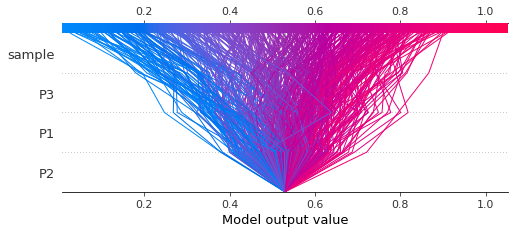

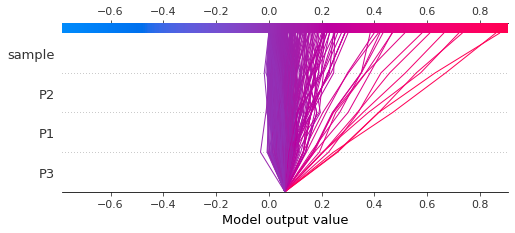

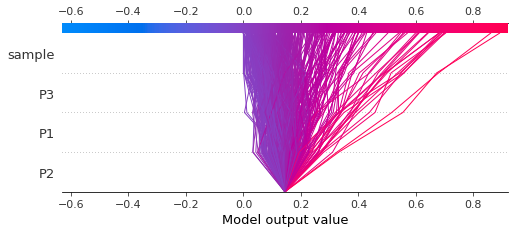

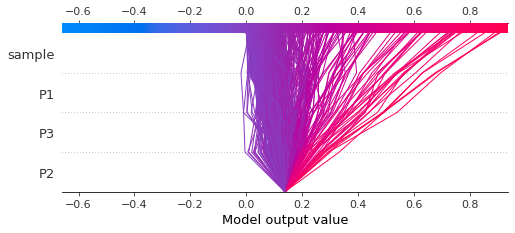

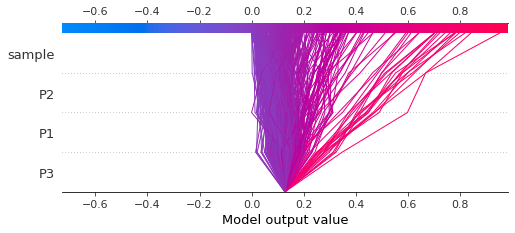

In [ ]:
sample_index = 0
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 1
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 2
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 3
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 4
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

In [ ]:
# create an ELI5 explainer object
explainer = eli5.sklearn.explain_prediction.explain_prediction_sklearn(clf5, X_test.iloc[4, :])

# display ELI5 explanation
display(explainer)

X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

Explanation(estimator="RandomForestClassifier(criterion='entropy', oob_score=<class 'bool'>,\n                       random_state=0)", description='\nFeatures with largest coefficients per class.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target='nocoallition', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.5296313131313132, std=None, value=1.0), FeatureWeight(feature='P2', weight=0.061034019470196064, std=None, value='2_1'), FeatureWeight(feature='P1', weight=0.03530268427724735, std=None, value='4_11'), FeatureWeight(feature='sample', weight=0.003506438970168463, std=None, value='13_9')], neg=[FeatureWeight(feature='P3', weight=-0.03780778918225833, std=None, value='9_6')], pos_remaining=0, neg_remaining=0), proba=0.5916666666666667, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.061212121212121225, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.007449238011738039, std=None, value='4_11'), FeatureWeight(feature='P3', weight=0.004651434337389861, std=None, value='9_6')], neg=[FeatureWeight(feature='P2', weight=-0.032603572634204554, std=None, value='2_1'), FeatureWeight(feature='sample', weight=-0.020709220927044542, std=None, value='13_9')], pos_remaining=0, neg_remaining=0), proba=0.02, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.14425757575757575, std=None, value=1.0), FeatureWeight(feature='P3', weight=0.04238347585930748, std=None, value='9_6'), FeatureWeight(feature='sample', weight=0.028757573610892945, std=None, value='13_9')], neg=[FeatureWeight(feature='P1', weight=-0.043198294757331966, std=None, value='4_11'), FeatureWeight(feature='P2', weight=-0.023866997137110827, std=None, value='2_1')], pos_remaining=0, neg_remaining=0), proba=0.14833333333333332, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.13773737373737377, std=None, value=1.0), FeatureWeight(feature='P2', weight=0.026557570338286967, std=None, value='2_1')], neg=[FeatureWeight(feature='P1', weight=-0.013118887708251613, std=None, value='4_11'), FeatureWeight(feature='P3', weight=-0.008379568500932515, std=None, value='9_6'), FeatureWeight(feature='sample', weight=-0.002796487866476561, std=None, value='13_9')], pos_remaining=0, neg_remaining=0), proba=0.14, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.1271616161616162, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.013565260176598206, std=None, value='4_11')], neg=[FeatureWeight(feature='P2', weight=-0.03112102003716

Flip 40 percent

In [ ]:
# Example usage
flip_pct = 0.40
df_flipped=flip_class_labels(df_train, flip_pct)

In [ ]:
X_train1 = df_flipped.drop(["coallition"], axis=1)
y_train1 = df_flipped["coallition"]


In [ ]:
# Train a Random Forest classifier on the training data
clf6 = RandomForestClassifier(n_estimators=100, random_state=0,criterion="entropy",oob_score=bool)
clf6.fit(X_train1, y_train1)

accuracy = clf6.score(X_test, y_test)
print(f"Test accuracy: {accuracy:.2f}")

Test accuracy: 0.64


In [ ]:
y_pred6=clf6.predict(X_test)
np.unique(y_pred6, return_counts=True)

(array(['nocoallition', '{1_2_3}', '{1_2}', '{1_3}', '{2_3}'], dtype=object),
 array([392,  10,  32,  31,  30]))

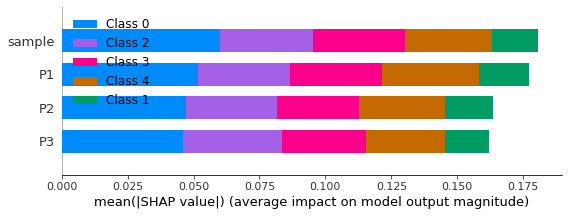

In [ ]:
# create a SHAP explainer object
explainer = shap.TreeExplainer(clf6)
# compute SHAP values
shap_values = explainer.shap_values(X_test)
# plot SHAP summary plot
shap.summary_plot(shap_values, X_test)

In [ ]:
output_index = 1

sample_index = 0
# load the javascript libraries
shap.initjs()

shap.force_plot(explainer.expected_value[output_index], shap_values[output_index][sample_index], X_test.iloc[sample_index,:])
shap.force_plot(explainer.expected_value[output_index], shap_values[output_index][:], X_test.iloc[:,:])



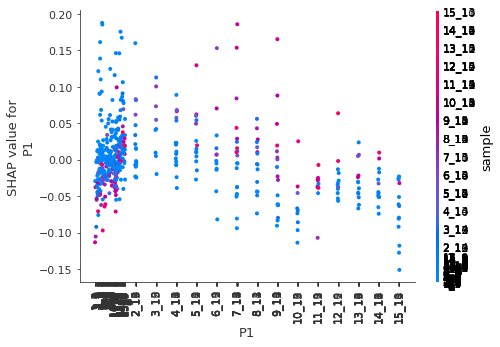

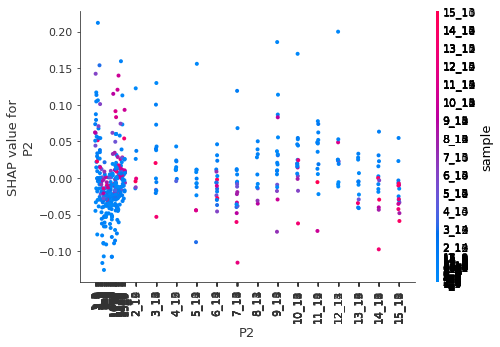

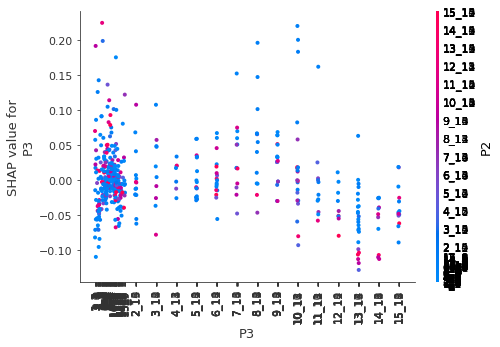

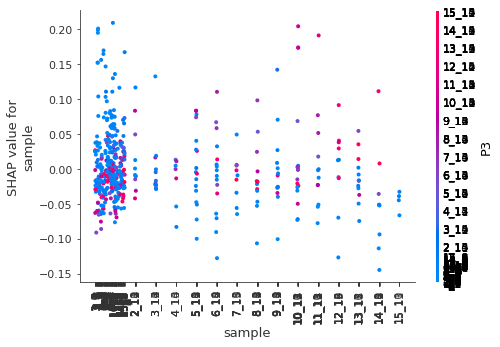

In [ ]:
# plot SHAP dependence ploy


# ax = plt.gca()
# ax.xaxis.set_ticklabels([])
# ax.xaxis.set_ticklabels(["2,15","3,15" ,"4,15", "5,15","6,15","7,15","8,15","9,15","10,15","11,15","12,15","13,15","14,15","15,15"])
# import matplotlib.pyplot as plt

#plt.rcParams["figure.figsize"] = fig_size
#shap.dependence_plot("age", shap_values, X)

shap.dependence_plot("P1", shap_values[3], X_test)
shap.dependence_plot("P2", shap_values[3], X_test)
shap.dependence_plot("P3", shap_values[3], X_test)
shap.dependence_plot("sample", shap_values[3], X_test)

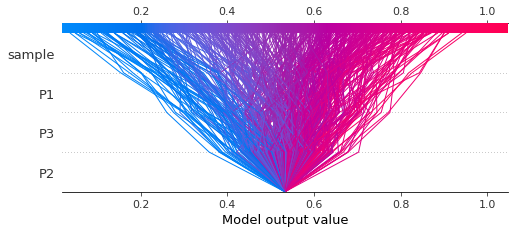

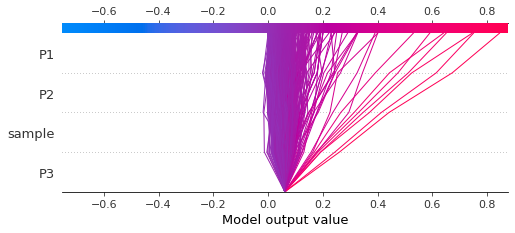

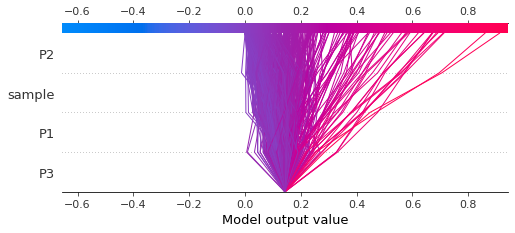

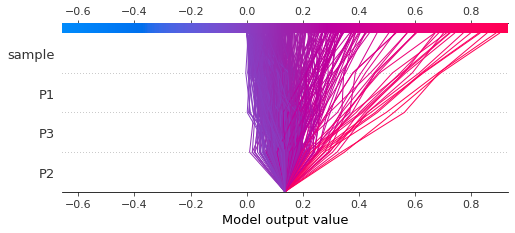

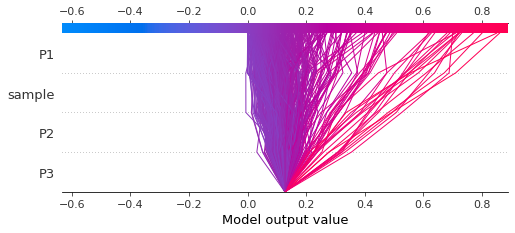

In [ ]:
sample_index = 0
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 1
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 2
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 3
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 4
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

In [ ]:
# create an ELI5 explainer object
explainer = eli5.sklearn.explain_prediction.explain_prediction_sklearn(clf6, X_test.iloc[4, :])

# display ELI5 explanation
display(explainer)


X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

Explanation(estimator="RandomForestClassifier(criterion='entropy', oob_score=<class 'bool'>,\n                       random_state=0)", description='\nFeatures with largest coefficients per class.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target='nocoallition', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.533010101010101, std=None, value=1.0), FeatureWeight(feature='P3', weight=0.07628066493370338, std=None, value='9_6'), FeatureWeight(feature='sample', weight=0.0651000596005375, std=None, value='13_9')], neg=[FeatureWeight(feature='P1', weight=-0.027579101974514516, std=None, value='4_11'), FeatureWeight(feature='P2', weight=-0.021811723569827374, std=None, value='2_1')], pos_remaining=0, neg_remaining=0), proba=0.625, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.06120202020202018, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.006007509540046674, std=None, value='4_11'), FeatureWeight(feature='P2', weight=0.0033866429026350774, std=None, value='2_1')], neg=[FeatureWeight(feature='sample', weight=-0.012688577275188156, std=None, value='13_9'), FeatureWeight(feature='P3', weight=-0.007907595369513803, std=None, value='9_6')], pos_remaining=0, neg_remaining=0), proba=0.05, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.1428131313131313, std=None, value=1.0)], neg=[FeatureWeight(feature='P3', weight=-0.019522761783673615, std=None, value='9_6'), FeatureWeight(feature='sample', weight=-0.013179744767560642, std=None, value='13_9'), FeatureWeight(feature='P2', weight=-0.012654171708884334, std=None, value='2_1'), FeatureWeight(feature='P1', weight=-0.007456453053012711, std=None, value='4_11')], pos_remaining=0, neg_remaining=0), proba=0.09, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.1356717171717172, std=None, value=1.0), FeatureWeight(feature='P2', weight=0.07105678369241153, std=None, value='2_1'), FeatureWeight(feature='P1', weight=0.02144401393148774, std=None, value='4_11')], neg=[FeatureWeight(feature='sample', weight=-0.029032676089661293, std=None, value='13_9'), FeatureWeight(feature='P3', weight=-0.0141398387059551, std=None, value='9_6')], pos_remaining=0, neg_remaining=0), proba=0.185, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.12730303030303028, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.007584031555992817, std=None, value='4_11')], neg=[FeatureWeight(feature='P2', weight=-0.039977531316334865, std=None, value='2_1'), F

Flip 50 percent

In [ ]:
# Example usage
flip_pct = 0.50
df_flipped=flip_class_labels(df_train, flip_pct)

In [ ]:
X_train1 = df_flipped.drop(["coallition"], axis=1)
y_train1 = df_flipped["coallition"]


In [ ]:
# Train a Random Forest classifier on the training data
clf7 = RandomForestClassifier(n_estimators=100, random_state=0,criterion="entropy",oob_score=bool)
clf7.fit(X_train1, y_train1)

accuracy = clf7.score(X_test, y_test)
print(f"Test accuracy: {accuracy:.2f}")

Test accuracy: 0.61


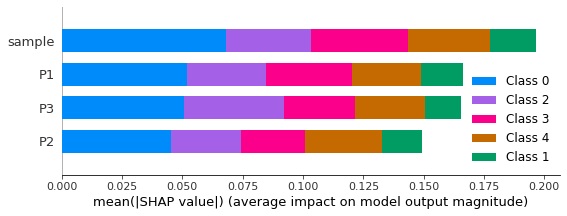

In [ ]:
# create a SHAP explainer object
explainer = shap.TreeExplainer(clf7)
# compute SHAP values
shap_values = explainer.shap_values(X_test)
# plot SHAP summary plot
shap.summary_plot(shap_values, X_test)

In [ ]:
output_index = 1

sample_index = 0
# load the javascript libraries
shap.initjs()

shap.force_plot(explainer.expected_value[output_index], shap_values[output_index][sample_index], X_test.iloc[sample_index,:])

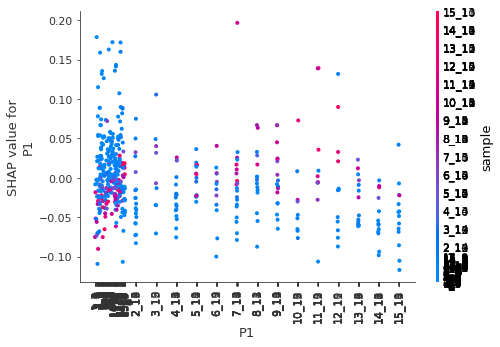

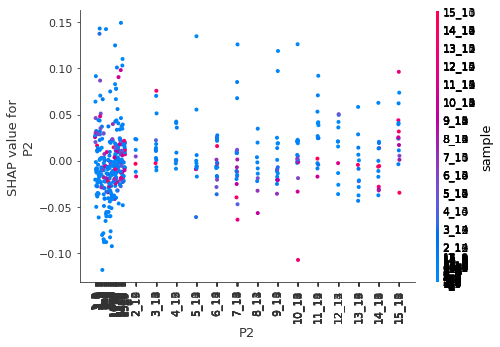

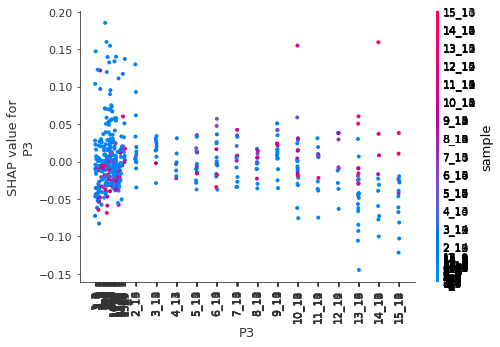

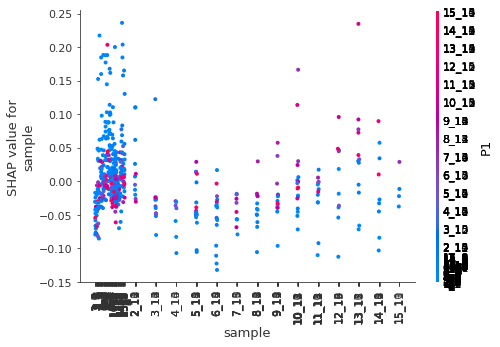

In [ ]:
# plot SHAP dependence ploy


# ax = plt.gca()
# ax.xaxis.set_ticklabels([])
# ax.xaxis.set_ticklabels(["2,15","3,15" ,"4,15", "5,15","6,15","7,15","8,15","9,15","10,15","11,15","12,15","13,15","14,15","15,15"])
# import matplotlib.pyplot as plt

#plt.rcParams["figure.figsize"] = fig_size
#shap.dependence_plot("age", shap_values, X)

shap.dependence_plot("P1", shap_values[3], X_test)
shap.dependence_plot("P2", shap_values[3], X_test)
shap.dependence_plot("P3", shap_values[3], X_test)
shap.dependence_plot("sample", shap_values[3], X_test)

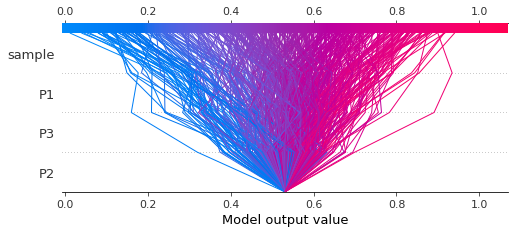

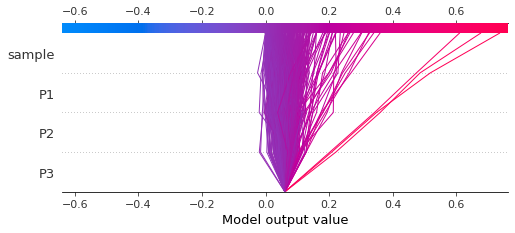

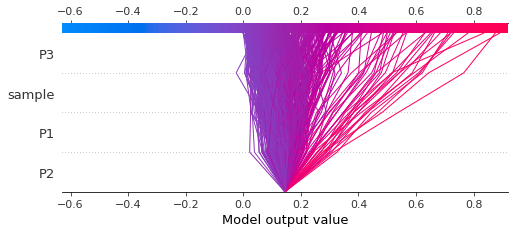

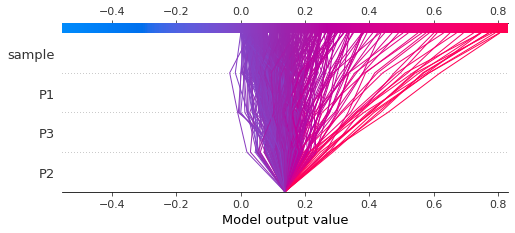

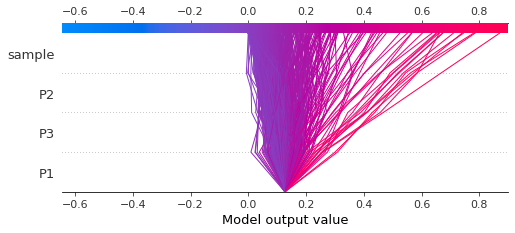

In [ ]:
sample_index = 0
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 1
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 2
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 3
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

sample_index = 4
shap.decision_plot(explainer.expected_value[sample_index], shap_values[sample_index], X_test.iloc[sample_index,:])

In [ ]:
# create an ELI5 explainer object
explainer = eli5.sklearn.explain_prediction.explain_prediction_sklearn(clf7, X_test.iloc[4, :])

# display ELI5 explanation
display(explainer)


X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but DecisionTreeClassifier was fitted without feature names
X has feature names, but Dec

Explanation(estimator="RandomForestClassifier(criterion='entropy', oob_score=<class 'bool'>,\n                       random_state=0)", description='\nFeatures with largest coefficients per class.\n\nFeature weights are calculated by following decision paths in trees\nof an ensemble (or a single tree for DecisionTreeClassifier).\nEach node of the tree has an output score, and contribution of a feature\non the decision path is how much the score changes from parent to child.\nWeights of all features sum to the output score or proba of the estimator.\n\nCaveats:\n1. Feature weights just show if the feature contributed positively or\n   negatively to the final score, and does not show how increasing or\n   decreasing the feature value will change the prediction.\n2. In some cases, feature weight can be close to zero for an important feature.\n   For example, in a single tree that computes XOR function, the feature at the\n   top of the tree will have zero weight because expected scores for both\n   branches are equal, so decision at the top feature does not change the\n   expected score. For an ensemble predicting XOR functions it might not be\n   a problem, but it is not reliable if most trees happen to choose the same\n   feature at the top.\n', error=None, method='decision path', is_regression=False, targets=[TargetExplanation(target='nocoallition', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.5304545454545454, std=None, value=1.0), FeatureWeight(feature='P3', weight=0.04463845356668468, std=None, value='9_6'), FeatureWeight(feature='P1', weight=0.038935199142476944, std=None, value='4_11'), FeatureWeight(feature='P2', weight=0.010655995129573695, std=None, value='2_1')], neg=[FeatureWeight(feature='sample', weight=-0.014684193293280742, std=None, value='13_9')], pos_remaining=0, neg_remaining=0), proba=0.61, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.060989898989899, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.015006659562991418, std=None, value='4_11')], neg=[FeatureWeight(feature='sample', weight=-0.04145901335896541, std=None, value='13_9'), FeatureWeight(feature='P3', weight=-0.0031063127954411816, std=None, value='9_6'), FeatureWeight(feature='P2', weight=-0.0014312323984838127, std=None, value='2_1')], pos_remaining=0, neg_remaining=0), proba=0.03, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_2}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.14451010101010103, std=None, value=1.0), FeatureWeight(feature='P1', weight=0.009444981057746615, std=None, value='4_11'), FeatureWeight(feature='sample', weight=0.004997988357882073, std=None, value='13_9')], neg=[FeatureWeight(feature='P3', weight=-0.07008086861524782, std=None, value='9_6'), FeatureWeight(feature='P2', weight=-0.008872201810481886, std=None, value='2_1')], pos_remaining=0, neg_remaining=0), proba=0.08, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{1_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.13735858585858587, std=None, value=1.0), FeatureWeight(feature='sample', weight=0.04971564638331107, std=None, value='13_9'), FeatureWeight(feature='P3', weight=0.033170365365319525, std=None, value='9_6')], neg=[FeatureWeight(feature='P1', weight=-0.0309787113605195, std=None, value='4_11'), FeatureWeight(feature='P2', weight=-0.01426588624669697, std=None, value='2_1')], pos_remaining=0, neg_remaining=0), proba=0.175, score=None, weighted_spans=None, heatmap=None), TargetExplanation(target='{2_3}', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.12668686868686865, std=None, value=1.0), FeatureWeight(feature='P2', weight=0.013913325326088983, std=None, value='2_1'), FeatureWeight(feature='sample', weight=0.0014295719110529977, std=None, value='13_9')], neg